## The following code is validation for the two-state linear ODE system

## Selecting restart and run all cells (FF symbol) should produce the consistency methodology result

## Disclaimer: this is test-code and is not properly commented, formatted, or explained

In [1]:
# import sys  
# !{sys.executable} -m pip install --user matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import chirp, sweep_poly
import numpy as np
from scipy.integrate import odeint
from sklearn.linear_model import Lasso
import scipy.io as sio
import os
import pysindy as ps
#%matplotlib inline
import mpld3
mpld3.enable_notebook()
#FOR STATS
import math
import statistics as stats
import random
from random import gauss
from scipy.stats import kurtosis, skew
from scipy.signal import savgol_filter as savgol
## END OF IMPORTS
# WE NEED TO CHECK FOR DUPLICATE IMPORTS, IT SAYS WE HAVE DONE DUPLICATE IMPORTS

#-- DEFINE FUNCTIONS -- #-- DEFINE FUNCTIONS -- #-- DEFINE FUNCTIONS -- #-- DEFINE FUNCTIONS -- #-- DEFINE FUNCTIONS -- #
## System models 
def u_fun(t):
    return np.column_stack([ain*chirp(t, f0=1, f1=5, t1=20, method='linear')]) #ain*np.sin(fin* t)])

def dualCap(x,t):
    u = u_fun(t)
    return [
        (a*x[0]) + (b*x[1]) , # + (e*u[0]), 
        (c*x[0]) + (d*x[1])            
    ]

## Noise adders 
def relativeNoise(true_data, nl):
    noise_data = true_data
    print(noise_data.shape)
    for col in range(noise_data.shape[1]):
        for row in range(noise_data.shape[0]):
            noise_data[row][col] = true_data[row][col] + np.random.normal(0,nl*true_data[row][col],1)
    return noise_data

# THESE ARE FOR STATS
def getStdDev(bd): # COMPLETE CONVERSION
    stdDevs = [];
    for col in range(bd.shape[1]):
        stdDevs.append(stats.stdev(bd[:,col]))
    return  stdDevs

def getMean(bd): # COMPLETE CONVERSION
    means = [];
    for col in range(bd.shape[1]):
        means.append(abs(sum(bd[:,col])/bd.shape[0]))
    return means

def getLBF(bd): # COMPLETE CONVERSION
    L = bd.shape[0]
    W = bd.shape[1]
    LBF = np.zeros((L,W)) # Create an empty 2D array
    
    for col in range(W): # HANDLES FIRST POINT --> AVE OF 1st and 2nd point
        LBF[0][col] = ((bd[0][col]+bd[1][col])/2); #--> Doing it twice for C1 and C2

    for col in range(W): # HANDLES MIDDLE POINTS --> AVE of n-1, n+1, n
        for row in range(1, L-1):
            LBF[row][col] = ((bd[row-1][col]+bd[row][col]+bd[row+1][col])/3);
    
    for col in range(W): # HANDLES LAST POINT --> AVE of last and 2nd last point
        LBF[L-1][col] = ((bd[L-2][col]+bd[L-1][col])/2);
    return LBF;

def margins(bd, LBF, mult): # COMPLETE CONVERSION
    L = bd.shape[0] # Number of rows
    W = bd.shape[1] # Number of columns (states)
    limits = np.zeros((L,2*W)) # Create an empty 2D array with 2*W columns
    for col in range(0, W):
        limits[:, 2*col] = LBF[:,col]+abs(mult*(LBF[:,col]-bd[:,col])); # UL 
        limits[:, 2*col+1] = LBF[:,col]-abs(mult*(LBF[:,col]-bd[:,col])); # LL
    return limits;

# FOR PREDICTION ERROR
def predictionError(LBF, prediction): # COMPLETE CONVERSION
    
    L = prediction.shape[0]
    W = prediction.shape[1]
    error = np.zeros((L, W)) # Create an empty 2D array with six columns
    for col in range(0, W):
        error[:,col] = savgol(abs((LBF[0:L,col]-prediction[:,col])),L-1, 2, deriv =1) # Error for C1 
    return error;

# FOR DATASET GENERATION
def correctionData(limits, L, W, shift, thiccboi, deltaShift):
    # L = num rows
    # W = num columns/states
    newDataset = np.zeros((L,W))
#     newDataset[:,:] = limits[0:L, [1,3]]+(((limits[0:L, [0,2]]-limits[0:L, [1,3]])/2)) # MIDLINE
    newDataset[:,:] = limits[0:L, 1:limits.shape[1]:2]+(((limits[0:L, 0:limits.shape[1]:2]-limits[0:L, 1:limits.shape[1]:2])/2)) # MIDLINE
   
    
    for col in range(0,W):
        for row in range(0,L):
            rn = random.gauss(shift[col], thiccboi[col]) # CAN BE POSTIVE OR NEGATIVE --> MOVING IT UP AND DOWN
            
            if (rn+newDataset[row][col] > limits[0:L, 1:limits.shape[1]:2][row][col] and rn+newDataset[row][col] < limits[0:L, 0:limits.shape[1]:2][row][col]):
                newDataset[row][col] = rn+newDataset[row][col]
                
            else:
                if(rn+newDataset[row][col]<limits[0:L, 1:limits.shape[1]:2][row][col]):
                    newDataset[row][col] = limits[0:L, 1:limits.shape[1]:2][row][col];
                    
                else: 
                    
                    if(rn+newDataset[row][col]>limits[0:L, 0:limits.shape[1]:2][row][col]):
                        
                        newDataset[row][col] = limits[0:L, 0:limits.shape[1]:2][row][col];
                        
                        
            shift[col]=shift[col]+deltaShift[col]
    return newDataset

# -- SYSTEM PARAMETERS --# -- SYSTEM PARAMETERS --# -- SYSTEM PARAMETERS --# -- SYSTEM PARAMETERS -- #
# Circuit Parameters
fc = 20;
r1 = 1000;
r2 = 1000;
c1 = 100e-9;
c2 = (1/(r1*r2*c1))*(1/(fc*2*np.pi))**2;

# State-Space Coefficients
a = -1*((1/(r1*c1))+(1/(r2*c1)));
b = 1/(r2*c1)
c = 1/(r2*c2)
d = -1/(r2*c2)
e = 1/(r1*c1)

# Circuit Input Parameters
fin = 5
ain = 10
fm = fin*3
m_noise_p = 0.00001 # Percentage of amplitude
miss_val = 0.0000;

#-- BEGIN SIMULATION -- #-- BEGIN SIMULATION -- #-- BEGIN SIMULATION -- #-- BEGIN SIMULATION -- #-- BEGIN SIMULATION -- #

In [2]:
np.random.seed(121212)
trainDuration = 0.4 # Data-time for training dataset
set_size=10

# -- SET SIMULATION RUNTIME PARAMETERS
dt = 0.001 # Timestep

totalDuration = 10
# print(int(random.uniform(0, 100)) )
# seed = int(random.uniform(0, 100))# Seed for the noise #112 (96)
# seed = 123
clean_set = 0
noisy_set = 0.1 #<-- noise levels
 # Max = 0.5 # Standard = 0.1 # Min = 0.005

x0_train = [5,10] # Initial conditions for capacitors (volts)

t_train = np.arange(0, trainDuration, dt)
x_train = odeint(dualCap, x0_train, t_train)
t_total = np.arange(0, totalDuration, dt)
x_total = odeint(dualCap, x0_train, t_total) 

# -- GENERATE DATA -- # -- GENERATE DATA -- # -- GENERATE DATA -- # -- GENERATE DATA -- # -- GENERATE DATA -- #
# For noise implementation
# np.random.seed(seed)  # Seed for reproducibility
noise_levels = [clean_set, noisy_set] 
# Variable creation
models_noD = []; train_noise = []; total_noise = []; x_sim_noD = [];

# FOR SAVITZKY GOLAY --> Differentiation method
windowSize = 3; # MUST BE ODD
windowHalf = 0.5*windowSize;
polyOrder = 2 #Must be less than windowSize
# differentiation_method=ps.SINDyDerivative(kind='savitzky_golay', left=windowHalf, right=windowHalf, order=polyOrder),

maxNOISE = np.max(abs(noise_levels[1]*np.random.randn(*x_train.shape)))
print("MAXIMUM OBSERVED NOISE: ", maxNOISE)

# CARRY OUT DATA GENERATION
for nl in noise_levels:
    x_train_noisy = x_train + nl * np.random.randn(*x_train.shape)
    x_total_noisy = x_total + nl * np.random.randn(*x_total.shape)
    
    train_noise.append(x_train_noisy)
    total_noise.append(x_total_noisy)
    
    model = ps.SINDy(
#       differentiation_method = ps.SmoothedFiniteDifference(),
        differentiation_method=ps.SINDyDerivative(kind='savitzky_golay', left=windowHalf, right=windowHalf, order=polyOrder),
        optimizer=ps.STLSQ(),
        t_default = dt
    )
    model.fit(
        x_train_noisy,
        t=dt,
        quiet=True
    )
    model.print()
    models_noD.append(model)
    x_sim_noD.append(model.simulate(x_train[0], t_total))

MAXIMUM OBSERVED NOISE:  0.3017888240922963
x0' = -142.447 x0 + 70.832 x1
x1' = -284.542 x0 + 141.488 x1
x0' = 3.470 1 + -0.794 x1
x1' = 0.648 1 + -0.302 x0 + -0.704 x1


/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/exporter.py:267: MatplotlibDeprecationWarning: 
The get_offset_position function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  offset_order = offset_dict[collection.get_offset_position()]
/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/utils.py:69: UserWarning: line style '(0.0, None)' not understood: defaulting to solid line.
  "defaulting to solid line.".format(ls))


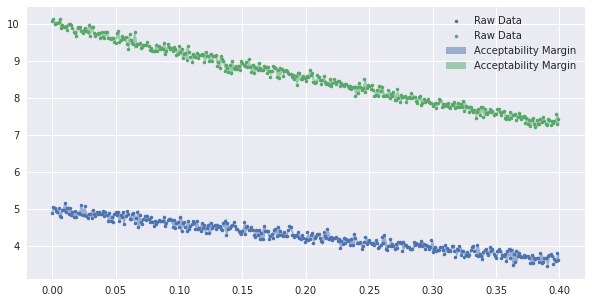

In [3]:
# -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- #
LBF = getLBF(total_noise[1]); # Find the line of best fit
# -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- #
relaxation = 1;
limits = margins(total_noise[1],LBF, relaxation) # limits[:, i]. i=0-3 are margins; i=4&5 are error signals (C1, C2)

L = int(trainDuration/dt)
fig = plt.figure(figsize = (10,5))
plt.style.use('seaborn')
# # plt.scatter(t_train[0:L]/dt, total_noise[1][0:L,0], marker=".")
D = 1
plt.plot(t_train[0:L:D], total_noise[1][0:L:D,0], '.',   label="Raw Data")
plt.plot(t_train[0:L:D], total_noise[1][0:L:D,1], '.' , label="Raw Data")

# plt.plot(LBF[0:L,0], label="Line of Best Fit")

# plt.plot(limits[0:L,0], label='Upper Margin')
# plt.plot(limits[0:L,1], label='Lower Margin')


# # plt.plot(t_total, x_sim_noD[model_idx][:, 0], "k--")
# plt.plot(t_total, total_noise[1][0:L,0], label="Raw Data")

# # plt.plot(t_total, x_total[: t_total.size, 1])
# plt.plot(t_total, x_sim_noD[model_idx][0:L, 1], label="Raw Data")

# # plt.plot(t_total, x_sim_noD[model_idx][:, 0], "k--")
# plt.plot(t_total, x_sim_noD[model_idx][:, 0], label="Prediction")

# # plt.plot(t_total, x_total[: t_total.size, 1])
# plt.plot(t_total, x_sim_noD[model_idx][:, 1], label="Prediction")

# plt.plot(t_total, total_noise[0][:,:], label="Prediction")

t1 = np.linspace(0,totalDuration,int(totalDuration/dt))
t2 = np.linspace(0,trainDuration,L)

temp = 'Acceptability Margin'
plt.fill_between(t2, limits[0:L,1], limits[0:L,0], alpha=0.5 , label=temp)
plt.fill_between(t2, limits[0:L,3], limits[0:L,2], alpha=0.5 , label=temp)

plt.legend()

Text(0.5, 0, 'time')

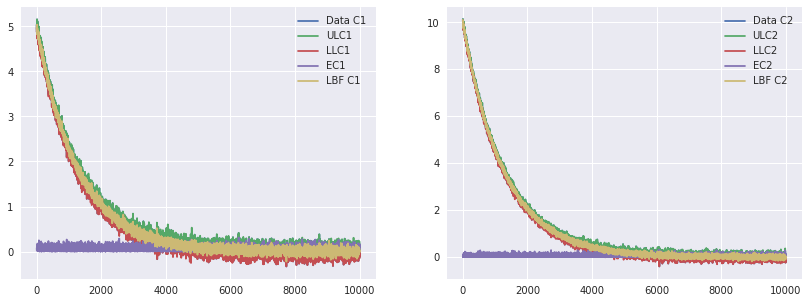

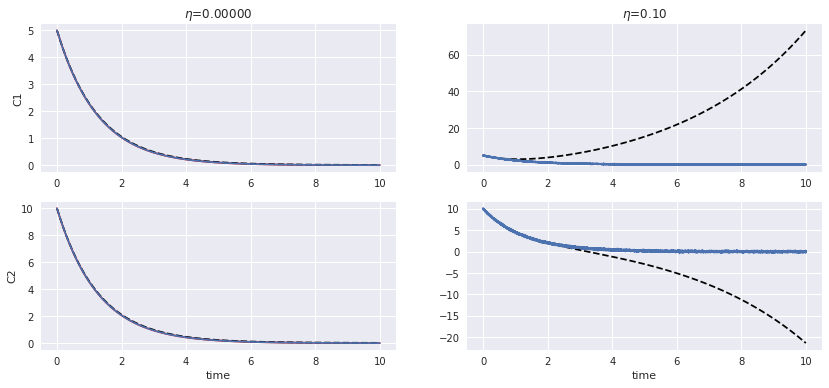

In [4]:
# -- PLOT THE DATASET GRAPHS -- # -- PLOT THE DATASET GRAPHS -- # -- PLOT THE DATASET GRAPHS -- #
fig = plt.figure(figsize=(14, 5))
fig.tight_layout()
axs1 = fig.add_subplot(121)
axs2 = fig.add_subplot(122)
axs1.plot(total_noise[1][:,0], label='Data C1')
axs2.plot(total_noise[1][:,1], label='Data C2')

axs1.plot(limits[:,0], label='ULC1')
axs1.plot(limits[:,1], label='LLC1')
axs1.plot(abs((LBF[:,0]-limits[:,0])), label='EC1')
axs1.plot(LBF[:,0], label='LBF C1')
axs1.legend()

axs2.plot(limits[:,2], label='ULC2')
axs2.plot(limits[:,3], label='LLC2')
axs2.plot(abs((LBF[:,1]-limits[:,2])), label='EC2')
axs2.plot(LBF[:,1], label='LBF C2')
axs2.legend()

# -- VIEW PREDICTION -- TRUE-SET AND FALSE-SET -- # -- VIEW PREDICTION -- TRUE-SET AND FALSE-SET -- #
fig = plt.figure(figsize=(14, 6))
fig.tight_layout()

model_idx = 0
ax = fig.add_subplot(221)
ax.plot(t_total, x_total[: t_total.size, 0], "r")
ax.plot(t_total, x_sim_noD[model_idx][:, 0], "k--")
ax.plot(t_total, total_noise[0][:,0])
plt.title(f"$\eta$={noise_levels[model_idx]:.5f}")
plt.ylabel("C1")

ax = fig.add_subplot(223)
ax.plot(t_total, x_total[: t_total.size, 1], "r")
ax.plot(t_total, x_sim_noD[model_idx][:, 1], "k--")
ax.plot(t_total, total_noise[0][:,1])
plt.xlabel("time")
plt.ylabel("C2")

model_idx = 1
ax = fig.add_subplot(222)
ax.plot(t_total, x_total[: t_total.size, 0], "r")
ax.plot(t_total, x_sim_noD[model_idx][:, 0], "k--")
ax.plot(t_total, total_noise[1][:,0])
plt.title(f"$\eta$={noise_levels[model_idx]:.2f}")

ax = fig.add_subplot(224)
ax.plot(t_total, x_total[: t_total.size, 1], "r")
ax.plot(t_total, x_sim_noD[model_idx][:, 1], "k--")
ax.plot(t_total, total_noise[1][:,1])
plt.xlabel("time")

# Corrective Methodology Below

In [5]:
L = int(trainDuration/dt) # NUMBER OF SAMPLES IN TRAINING INTERVAL
W = total_noise[1].shape[1]
# -- GENERATE LBF AND ACCEPTABILITY MARGINS -- # -- GENERATE LBF AND ACCEPTABILITY MARGINS -- #
# -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- # -- LBF -- #
LBF = getLBF(total_noise[1]); # Find the line of best fit
# -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- # -- ERROR MARGINS -- #
relaxation = 1;
limits = margins(total_noise[1],LBF, relaxation) # limits[:, i]. i=0-3 are margins; i=4&5 are error signals (C1, C2)
# -- CORRECTIVE METHODOLOGY -- # -- CORRECTIVE METHODOLOGY -- # -- CORRECTIVE METHODOLOGY -- #
output_corrective_data = []
model_collector = []
cd_collection = []


# -- FOR DATA GENERATION -- # -- FOR DATA GENERATION -- # -- FOR DATA GENERATION -- # -- FOR DATA GENERATION -- #
# set_size = int(1.5*20*noisy_set/(trainDuration));

# SHIFT RANGE VARIABLES # CONVERTED
start = getMean(limits[0:L, 1:limits.shape[1]:2]-LBF[0:L,:]) # LL-LBF --> distance from the middle of the thing from margins
# Average distance between LBF and LL --> MSV
shift_end = start
shift_start = [x * -1 for x in start]
shift_ss = set_size
                
# THICCBOI RANGE VARIABLES (Standard Deviation) # CONVERTED
thiccboi_start = [0,0]
thiccboi_end = getStdDev(total_noise[1][0:L,:]) 
thiccboi_ss = set_size

# deltaShift RANGE VARIABLES # CONVERTED
dShift_end = shift_end
dShift_start = shift_start
deltaShift_ss = set_size

# RECORD OF DEVELOPED MODELS BY APRIORI METHOD # CONVERTED
iteration_count = 0
good_models = []
prederr_save = []

numIterations = deltaShift_ss*thiccboi_ss*shift_ss

# FOR FILTERING
upper_selection = np.mean(shift_end)*0.8 #--> 0.8 is the weigting (20% tighter) US
lower_selection = 0
in_bound_models = []
bestmodel = 0
lastmag = 100

# SEED FOR THE DATA GENERATION
# random.seed(seed) # 7 is perfect, lol. 18 too

for x in range(thiccboi_ss):
    # FOR DATAGEN PARAMETERS # CONVERTED
    thiccboi = [v * (x/thiccboi_ss) for v in thiccboi_end]
    for y in range(shift_ss):
        
        # FOR DATAGEN PARAMETERS # CONVERTED
        yvs = [(y*v/shift_ss) for v in shift_end]
        yus = [(y*u/shift_ss) for u in shift_start]
        shift = [];
        for col in range(0, len(yvs)):
            shift.append(shift_start[col] + yvs[col] - yus[col])

        
        for z in range(deltaShift_ss):
            print("Percentage complete: ", ((iteration_count+1)/numIterations)*100, "(", iteration_count,"/", numIterations,")")
            
            
            # FOR DATAGEN PARAMETERS
            zvLs = [(z*v/(L*deltaShift_ss)) for v in dShift_end]
            zuLs = [(z*u/(L*deltaShift_ss)) for u in dShift_start]
            shiftL = [s/L for s in shift]
            uL = [u/L for u in dShift_start]    
            deltaShift = []
            for col in range(0, len(zvLs)):
                deltaShift.append(uL[col] + zvLs[col] - zuLs[col] - shiftL[col])
            
            cd = correctionData(limits, L,W , shift, thiccboi, deltaShift)
            cd_collection.append(cd)
            
            model = ps.SINDy(
                differentiation_method=ps.SINDyDerivative(kind='savitzky_golay', left=windowHalf, right=windowHalf, order=polyOrder),
                optimizer=ps.STLSQ(),
                t_default = dt
            )
            model.fit(
                cd,
                t=dt,
                quiet=True
            )
#             model.print()
            prederr = predictionError(LBF, model.simulate(x0_train, t_total))
            mag = np.mean(getMean(prederr[0:L,:])) # Output [,] 1x2 --> TOTAL MEAN PREDICTION ERROR
        
            output_corrective_data.extend([mag])
            
            # APRIORI FILTER METHOD
            coef_mat = model.coefficients()
            mult = np.zeros(coef_mat.shape)
            mult[0,1] = 1; mult[0,2] = 1; mult[1,1] = 1; mult[1,2] = 1
            model_collector.append(model)
            if ((coef_mat == mult*coef_mat).all() and np.count_nonzero(coef_mat) == 4):
                print(": GOOD MODEL FOUND")
                good_models.append(iteration_count) 
            
            # NON-APRIORI FILTER METHOD
            if (mag > lower_selection and mag < upper_selection):
                in_bound_models.append(iteration_count)
                prederr_save.append(prederr)
                if (mag < lastmag):
                    lastmag = mag
                    bestmodel = iteration_count
                    
            iteration_count = iteration_count + 1 
            
            
print("DONE")
print("APRIORI: ", good_models)
print("FILTER: ", in_bound_models)
print("The selected model was: ", bestmodel)

Percentage complete:  0.1 ( 0 / 1000 )
Percentage complete:  0.2 ( 1 / 1000 )
Percentage complete:  0.3 ( 2 / 1000 )
Percentage complete:  0.4 ( 3 / 1000 )
Percentage complete:  0.5 ( 4 / 1000 )
Percentage complete:  0.6 ( 5 / 1000 )
Percentage complete:  0.7000000000000001 ( 6 / 1000 )
Percentage complete:  0.8 ( 7 / 1000 )
Percentage complete:  0.8999999999999999 ( 8 / 1000 )
Percentage complete:  1.0 ( 9 / 1000 )
Percentage complete:  1.0999999999999999 ( 10 / 1000 )
Percentage complete:  1.2 ( 11 / 1000 )
Percentage complete:  1.3 ( 12 / 1000 )
Percentage complete:  1.4000000000000001 ( 13 / 1000 )
Percentage complete:  1.5 ( 14 / 1000 )
Percentage complete:  1.6 ( 15 / 1000 )
Percentage complete:  1.7000000000000002 ( 16 / 1000 )
Percentage complete:  1.7999999999999998 ( 17 / 1000 )
Percentage complete:  1.9 ( 18 / 1000 )
Percentage complete:  2.0 ( 19 / 1000 )
Percentage complete:  2.1 ( 20 / 1000 )
Percentage complete:  2.1999999999999997 ( 21 / 1000 )
Percentage complete:  2.3

Percentage complete:  18.4 ( 183 / 1000 )
Percentage complete:  18.5 ( 184 / 1000 )
Percentage complete:  18.6 ( 185 / 1000 )
Percentage complete:  18.7 ( 186 / 1000 )
Percentage complete:  18.8 ( 187 / 1000 )
Percentage complete:  18.9 ( 188 / 1000 )
Percentage complete:  19.0 ( 189 / 1000 )
Percentage complete:  19.1 ( 190 / 1000 )
Percentage complete:  19.2 ( 191 / 1000 )
Percentage complete:  19.3 ( 192 / 1000 )
Percentage complete:  19.400000000000002 ( 193 / 1000 )
Percentage complete:  19.5 ( 194 / 1000 )
Percentage complete:  19.6 ( 195 / 1000 )
Percentage complete:  19.7 ( 196 / 1000 )
Percentage complete:  19.8 ( 197 / 1000 )
Percentage complete:  19.900000000000002 ( 198 / 1000 )
Percentage complete:  20.0 ( 199 / 1000 )
Percentage complete:  20.1 ( 200 / 1000 )
Percentage complete:  20.200000000000003 ( 201 / 1000 )
Percentage complete:  20.3 ( 202 / 1000 )
Percentage complete:  20.4 ( 203 / 1000 )
Percentage complete:  20.5 ( 204 / 1000 )
Percentage complete:  20.599999999

Percentage complete:  36.1 ( 360 / 1000 )
Percentage complete:  36.199999999999996 ( 361 / 1000 )
Percentage complete:  36.3 ( 362 / 1000 )
Percentage complete:  36.4 ( 363 / 1000 )
Percentage complete:  36.5 ( 364 / 1000 )
Percentage complete:  36.6 ( 365 / 1000 )
Percentage complete:  36.7 ( 366 / 1000 )
Percentage complete:  36.8 ( 367 / 1000 )
Percentage complete:  36.9 ( 368 / 1000 )
Percentage complete:  37.0 ( 369 / 1000 )
Percentage complete:  37.1 ( 370 / 1000 )
Percentage complete:  37.2 ( 371 / 1000 )
Percentage complete:  37.3 ( 372 / 1000 )
Percentage complete:  37.4 ( 373 / 1000 )
Percentage complete:  37.5 ( 374 / 1000 )
: GOOD MODEL FOUND
Percentage complete:  37.6 ( 375 / 1000 )
Percentage complete:  37.7 ( 376 / 1000 )
Percentage complete:  37.8 ( 377 / 1000 )
Percentage complete:  37.9 ( 378 / 1000 )
Percentage complete:  38.0 ( 379 / 1000 )
Percentage complete:  38.1 ( 380 / 1000 )
Percentage complete:  38.2 ( 381 / 1000 )
Percentage complete:  38.3 ( 382 / 1000 )
P

Percentage complete:  54.300000000000004 ( 542 / 1000 )
Percentage complete:  54.400000000000006 ( 543 / 1000 )
Percentage complete:  54.50000000000001 ( 544 / 1000 )
Percentage complete:  54.6 ( 545 / 1000 )
Percentage complete:  54.7 ( 546 / 1000 )
Percentage complete:  54.800000000000004 ( 547 / 1000 )
Percentage complete:  54.900000000000006 ( 548 / 1000 )
Percentage complete:  55.00000000000001 ( 549 / 1000 )
Percentage complete:  55.1 ( 550 / 1000 )
Percentage complete:  55.2 ( 551 / 1000 )
Percentage complete:  55.300000000000004 ( 552 / 1000 )
Percentage complete:  55.400000000000006 ( 553 / 1000 )
Percentage complete:  55.50000000000001 ( 554 / 1000 )
Percentage complete:  55.60000000000001 ( 555 / 1000 )
Percentage complete:  55.7 ( 556 / 1000 )
Percentage complete:  55.800000000000004 ( 557 / 1000 )
Percentage complete:  55.900000000000006 ( 558 / 1000 )
Percentage complete:  56.00000000000001 ( 559 / 1000 )
Percentage complete:  56.10000000000001 ( 560 / 1000 )
Percentage c

Percentage complete:  71.8 ( 717 / 1000 )
Percentage complete:  71.89999999999999 ( 718 / 1000 )
Percentage complete:  72.0 ( 719 / 1000 )
Percentage complete:  72.1 ( 720 / 1000 )
Percentage complete:  72.2 ( 721 / 1000 )
Percentage complete:  72.3 ( 722 / 1000 )
Percentage complete:  72.39999999999999 ( 723 / 1000 )
Percentage complete:  72.5 ( 724 / 1000 )
: GOOD MODEL FOUND
Percentage complete:  72.6 ( 725 / 1000 )
Percentage complete:  72.7 ( 726 / 1000 )
Percentage complete:  72.8 ( 727 / 1000 )
Percentage complete:  72.89999999999999 ( 728 / 1000 )
Percentage complete:  73.0 ( 729 / 1000 )
Percentage complete:  73.1 ( 730 / 1000 )
Percentage complete:  73.2 ( 731 / 1000 )
Percentage complete:  73.3 ( 732 / 1000 )
Percentage complete:  73.4 ( 733 / 1000 )
Percentage complete:  73.5 ( 734 / 1000 )
Percentage complete:  73.6 ( 735 / 1000 )
Percentage complete:  73.7 ( 736 / 1000 )
Percentage complete:  73.8 ( 737 / 1000 )
Percentage complete:  73.9 ( 738 / 1000 )
Percentage complet

Percentage complete:  90.3 ( 902 / 1000 )
: GOOD MODEL FOUND
Percentage complete:  90.4 ( 903 / 1000 )
Percentage complete:  90.5 ( 904 / 1000 )
Percentage complete:  90.60000000000001 ( 905 / 1000 )
Percentage complete:  90.7 ( 906 / 1000 )
Percentage complete:  90.8 ( 907 / 1000 )
Percentage complete:  90.9 ( 908 / 1000 )
Percentage complete:  91.0 ( 909 / 1000 )
Percentage complete:  91.10000000000001 ( 910 / 1000 )
Percentage complete:  91.2 ( 911 / 1000 )
Percentage complete:  91.3 ( 912 / 1000 )
Percentage complete:  91.4 ( 913 / 1000 )
Percentage complete:  91.5 ( 914 / 1000 )
Percentage complete:  91.60000000000001 ( 915 / 1000 )
Percentage complete:  91.7 ( 916 / 1000 )
Percentage complete:  91.8 ( 917 / 1000 )
Percentage complete:  91.9 ( 918 / 1000 )
Percentage complete:  92.0 ( 919 / 1000 )
Percentage complete:  92.10000000000001 ( 920 / 1000 )
Percentage complete:  92.2 ( 921 / 1000 )
Percentage complete:  92.30000000000001 ( 922 / 1000 )
Percentage complete:  92.4 ( 923 /

The selected model was:  208
x0' = -0.170 x0 + -0.311 x1
x1' = -0.342 x0 + -0.622 x1


/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/exporter.py:267: MatplotlibDeprecationWarning: 
The get_offset_position function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  offset_order = offset_dict[collection.get_offset_position()]
/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/utils.py:69: UserWarning: line style '(0.0, None)' not understood: defaulting to solid line.
  "defaulting to solid line.".format(ls))


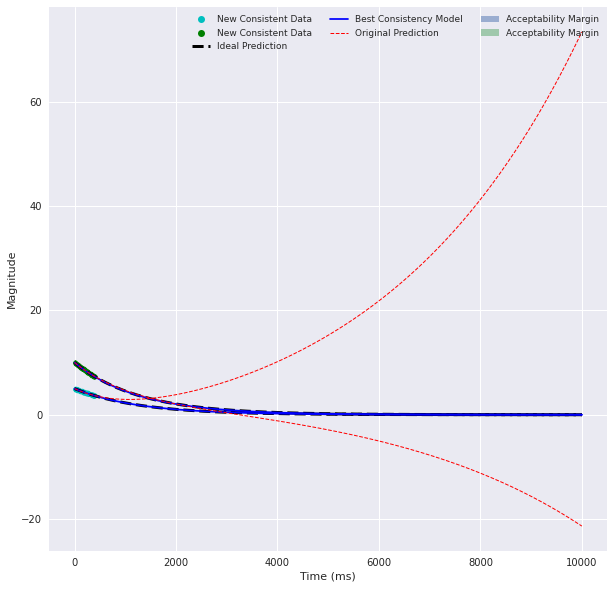

In [16]:

fig = plt.figure(figsize=(10, 10))
# fig.tight_layout()



plt
# fig, axes1 = plt.subplots()
plt.style.use('seaborn')
plt.xlabel('Time (ms)')
plt.ylabel('Magnitude')

plt.plot(t_train[0:L]/dt, cd_collection[bestmodel][:,0], 'c.', label='New Consistent Data', linewidth=0.5)  
plt.plot(t_train[0:L]/dt, cd_collection[bestmodel][:,1], 'g.', label='New Consistent Data', linewidth=0.5)

wid = 3;
plt.plot(x_total[:,0], "k--", label='Ideal Prediction', linewidth=wid)
plt.plot(x_total[:,1], "k--", linewidth=wid)
model = model_collector[bestmodel]
plt.plot(model.simulate(x0_train, t_total)[:,0],"b-", label = "Best Consistency Model")
plt.plot(model.simulate(x0_train, t_total)[:,1],"b-")

temp = 'Acceptability Margin'
plt.fill_between(t2/dt, limits[0:L,1], limits[0:L,0], alpha=0.5 , label=temp)
plt.fill_between(t2/dt, limits[0:L,2], limits[0:L,2], alpha=0.5 , label=temp)


plt.plot(x_sim_noD[1][:, 0], "r--", label="Original Prediction", linewidth=1 )
plt.plot(x_sim_noD[1][:, 1], "r--", linewidth=1)

plt.style.use('seaborn')
axes1.set_title('Dual Capacitor Discharge Prediction with 0.4 Seconds of Training Data')

plt.legend(
       scatterpoints=1,
   loc='upper right',
   markerscale=2, 
   ncol=3,
   fontsize=9)

print("The selected model was: ", bestmodel)
model.print()

The selected model was:  208
x0' = -0.170 x0 + -0.311 x1
x1' = -0.342 x0 + -0.622 x1


/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/exporter.py:267: MatplotlibDeprecationWarning: 
The get_offset_position function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  offset_order = offset_dict[collection.get_offset_position()]
/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/utils.py:69: UserWarning: line style '(0.0, None)' not understood: defaulting to solid line.
  "defaulting to solid line.".format(ls))


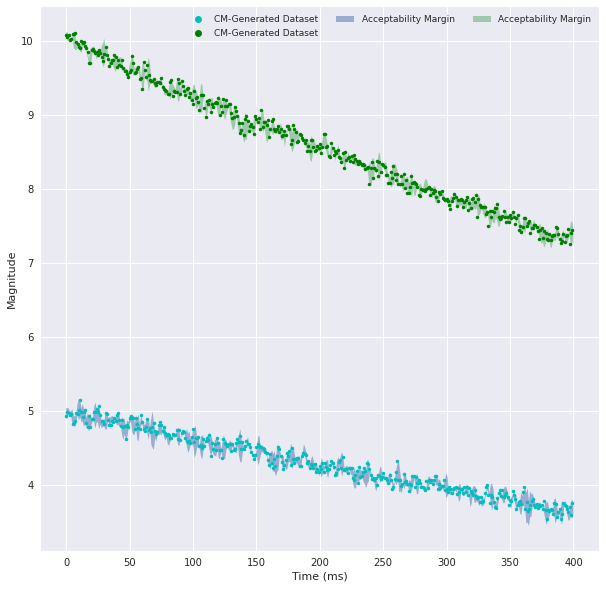

In [21]:
fig = plt.figure(figsize=(10, 10))
plt.fill_between(t2/dt, limits[0:L,1], limits[0:L,0], alpha=0.5 , label=temp)
plt.fill_between(t2/dt, limits[0:L,3], limits[0:L,2], alpha=0.5 , label=temp)

plt.style.use('seaborn')
plt.xlabel('Time (ms)')
plt.ylabel('Magnitude')


# axes2.plot(t_train[0:L]/dt, total_noise[1][0:L,:], '.') # OG
plt.plot(t_train[0:L]/dt, cd_collection[bestmodel][:,0], 'c.', linewidth=1, label='CM-Generated Dataset') # NEW
plt.plot(t_train[0:L]/dt, cd_collection[bestmodel][:,1], 'g.', linewidth=1, label='CM-Generated Dataset') # NEW


plt.legend(
       scatterpoints=1,
   loc='upper right',
   markerscale=2, 
   ncol=3,
   fontsize=9)

print("The selected model was: ", bestmodel)
model.print()

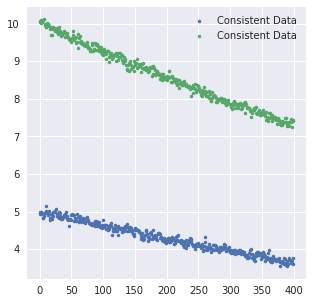

In [7]:
fig = plt.figure(figsize = (5,5))
plt.style.use('seaborn')
plt.plot(t_train[0:L]/dt, cd_collection[bestmodel], '.', label='Consistent Data')
plt.legend()

FILTERED MODELS:  1000
APRIORI MODELS:  20
SELECTED MODEL FROM FILTER METHOD:  208


Text(0, 0.5, 'model number')

/home/timothy/.local/lib/python3.6/site-packages/mpld3/mplexporter/exporter.py:267: MatplotlibDeprecationWarning: 
The get_offset_position function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
  offset_order = offset_dict[collection.get_offset_position()]


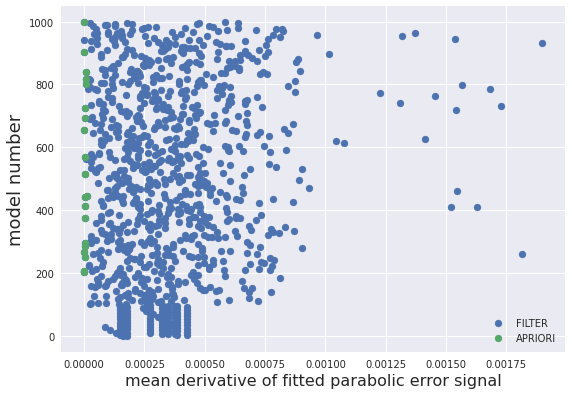

In [8]:
# plt.plot(in_bound_models, mag_selected)

mag_selected = []
mag_pre_selected = []

# FOR APRIORI MODEL FILTERING METHOD:
for i in range(0,len(good_models)):
    mag_pre_selected.append(output_corrective_data[good_models[i]])

    
    
# FOR NON-APRORI FILTERING METHOD:
min = 1; # FOR THE MINIMUM MEAN OF 1st derivate of ERROR SIGNAL
minMod = 0; # THE MODEL NUMBER OF THE FINAL, CHOSEN MODEL AND DATASET FROM THE CM
for i in range(0,len(in_bound_models)):
    mag_selected.append(output_corrective_data[in_bound_models[i]])

    
print("FILTERED MODELS: ", len(mag_selected))
print("APRIORI MODELS: ", len(good_models))
print("SELECTED MODEL FROM FILTER METHOD: ", bestmodel)

fig = plt.figure(figsize = (14,6))
axes1 = fig.add_axes([0.1, 0.1, 0.5, 0.8]) # main axes
axes1.scatter(mag_selected, in_bound_models, label='FILTER')
axes1.scatter(mag_pre_selected, good_models, label='APRIORI')
axes1.legend()

plt.xlabel("mean derivative of fitted parabolic error signal", fontsize=16)
plt.ylabel("model number", fontsize=18)